# Import and set colors

In [1]:
§#Import packages
import scanpy as sc
import anndata as ann
import numpy as np
import scipy as sp
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import rcParams
from matplotlib import cm, colors
from gprofiler import gprofiler

import os 

import seaborn as sb

In [2]:
plt.rcParams['figure.figsize']=(4,3) #rescale figures
sc.settings.verbosity = 3
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=False, fontsize=12, color_map='plasma')
sc.logging.print_header()

scanpy==1.7.1 anndata==0.7.5 umap==0.5.1 numpy==1.22.3 scipy==1.8.0 pandas==1.2.3 scikit-learn==0.24.1 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.4


In [3]:
#Define a nice colour map for gene expression
colors2 = plt.cm.plasma(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,20))
colorsComb = np.vstack([colors3, colors2])
mymap2 = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

# Set project file paths

In [4]:
file_path = '/Volumes/Seagate_Exp/Paper_sc_analysis/notebooks/analysis_early_time_points/040522_corrected_notebooks/Revision/'
#this is my file path please adapt it to your directory

In [5]:
data_dir =file_path +  'data/' 

In [6]:
table_dir = file_path + 'tables/'

In [25]:
sc.settings.figdir = file_path + 'figures/4a_control/'

In [8]:
import datetime

today = datetime.date.today().strftime('%y%m%d') #creates a YYMMDD string of today's date

# Read Data & downstream analysis

In [9]:
adata_postnorm = sc.read(data_dir + '230721adata_postnorm_scvi2_no12.h5ad')

## Select Intact and injury samples

In [10]:
adata_ctr_proc = adata_postnorm[np.in1d(adata_postnorm.obs['condition'], 
                           ['3dpi_CTRL', '5dpi_CTRL', 'INTACT'])].copy()

In [11]:
adata_ctr_proc.obs['condition'].value_counts()

INTACT       16964
5dpi_CTRL    14522
3dpi_CTRL     3646
Name: condition, dtype: int64

In [12]:
pd.crosstab(adata_ctr_proc.obs['sample_id'], adata_ctr_proc.obs['condition'])

condition,3dpi_CTRL,5dpi_CTRL,INTACT
sample_id,,,
21L008532,0,8190,0
MUC13721,0,0,2676
MUC13722,1850,0,0
MUC13723,1796,0,0
MUC13726,0,0,2474
MUC13727,0,1712,0
MUC13731,0,0,3389
MUC13732,0,0,3766
MUC18415,0,4620,0


In [13]:
adata_ctr_proc

AnnData object with n_obs × n_vars = 35132 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'highly_variable_nbatches', 'highly_variable_intersection'
    uns: '_scvi_manager_uuid', '_scvi_uuid', 'batch_colors', 'condition_colors', 'dendrogram_leiden_scVI', 'hvg', 'leiden', 'leiden1

In [14]:
adata_ctr_proc_2=adata_ctr_proc.copy()

In [15]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata_ctr_proc_2, use_rep="X_scVI",n_neighbors=30)


computing neighbors


OMP: Info #271: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)


In [16]:
sc.tl.umap(adata_ctr_proc_2)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:24)


In [17]:
sc.tl.leiden(adata_ctr_proc_2, key_added="leiden_ctr")

running Leiden clustering
    finished: found 30 clusters and added
    'leiden_ctr', the cluster labels (adata.obs, categorical) (0:00:07)


In [20]:
sc.tl.leiden(adata_ctr_proc_2, key_added="leiden_ctr2", resolution=2)

running Leiden clustering
    finished: found 42 clusters and added
    'leiden_ctr2', the cluster labels (adata.obs, categorical) (0:00:07)


In [18]:
sc.tl.leiden(adata_ctr_proc_2, key_added="leiden_ctr07", resolution=0.7)

running Leiden clustering
    finished: found 25 clusters and added
    'leiden_ctr07', the cluster labels (adata.obs, categorical) (0:00:06)


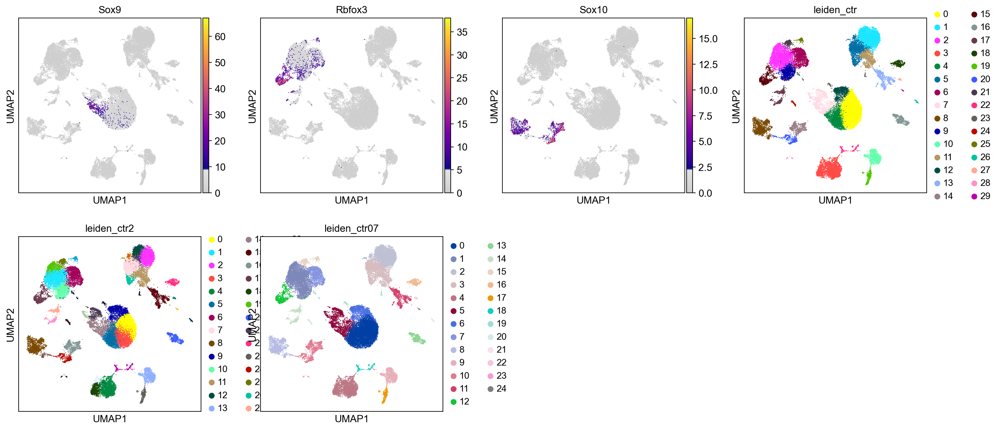

In [21]:
sc.pl.umap(adata_ctr_proc_2, color=['Sox9','Rbfox3','Sox10','leiden_ctr','leiden_ctr2','leiden_ctr07'], layer='counts',cmap=mymap2)

In [22]:
print(adata_ctr_proc_2.obs['condition'].value_counts())

INTACT       16964
5dpi_CTRL    14522
3dpi_CTRL     3646
Name: condition, dtype: int64


In [23]:
intact_subsam = sc.pp.subsample(adata_ctr_proc_2[adata_ctr_proc_2.obs['condition']=='INTACT'],n_obs=3646,copy=True).obs_names
five_dpi_V_subsam = sc.pp.subsample(adata_ctr_proc_2[adata_ctr_proc_2.obs['condition']=='5dpi_CTRL'],n_obs=3646,copy=True).obs_names
three_dpi_V_subsam = sc.pp.subsample(adata_ctr_proc_2[adata_ctr_proc_2.obs['condition']=='3dpi_CTRL'],n_obs=3646,copy=True).obs_names
adata_ctr_proc_2_subsam = adata_ctr_proc_2[list(intact_subsam) + list(five_dpi_V_subsam)+list(three_dpi_V_subsam)].copy()

In [24]:
sc.tl.embedding_density(adata_ctr_proc_2_subsam, basis='umap', groupby='condition')

computing density on 'umap'
--> added
    'umap_density_condition', densities (adata.obs)
    'umap_density_condition_params', parameter (adata.uns)


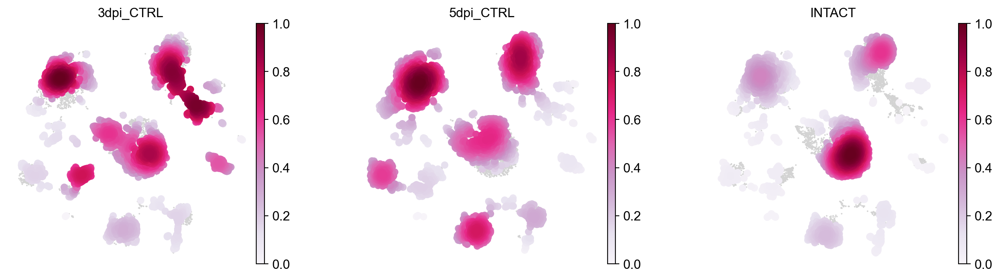

In [26]:
sc.pl.embedding_density(adata_ctr_proc_2_subsam, basis='umap',  key='umap_density_condition', color_map='PuRd', wspace=0.3, bg_dotsize = 8, frameon= False, ncols=5, save='_distribution_downscaling_ctr.png')

In [27]:
con_cl= ['#DC143C', '#ff9933','#20B2AA']

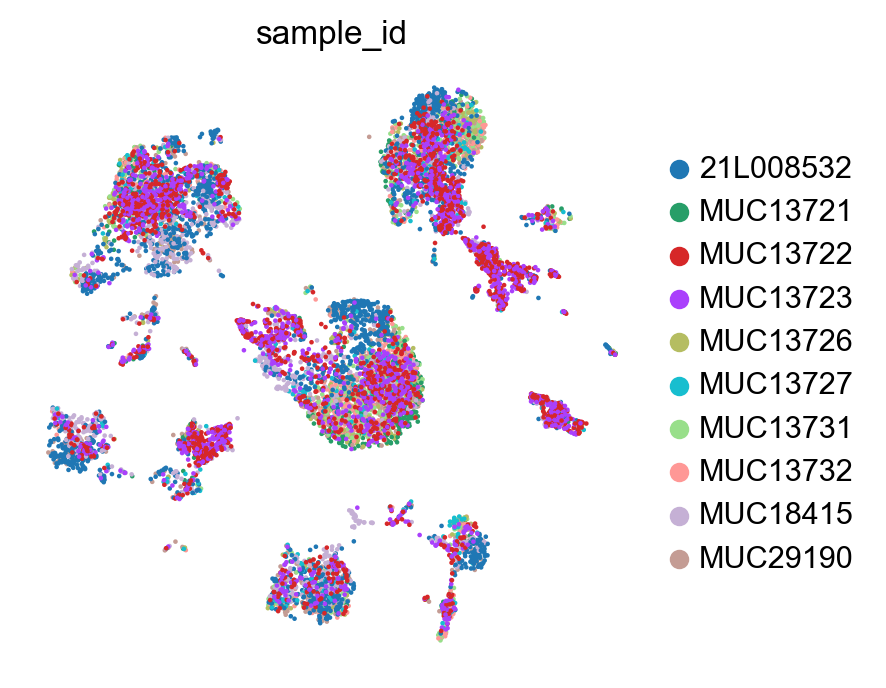

In [28]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='sample_id',legend_fontweight= 'normal', frameon= False ,)

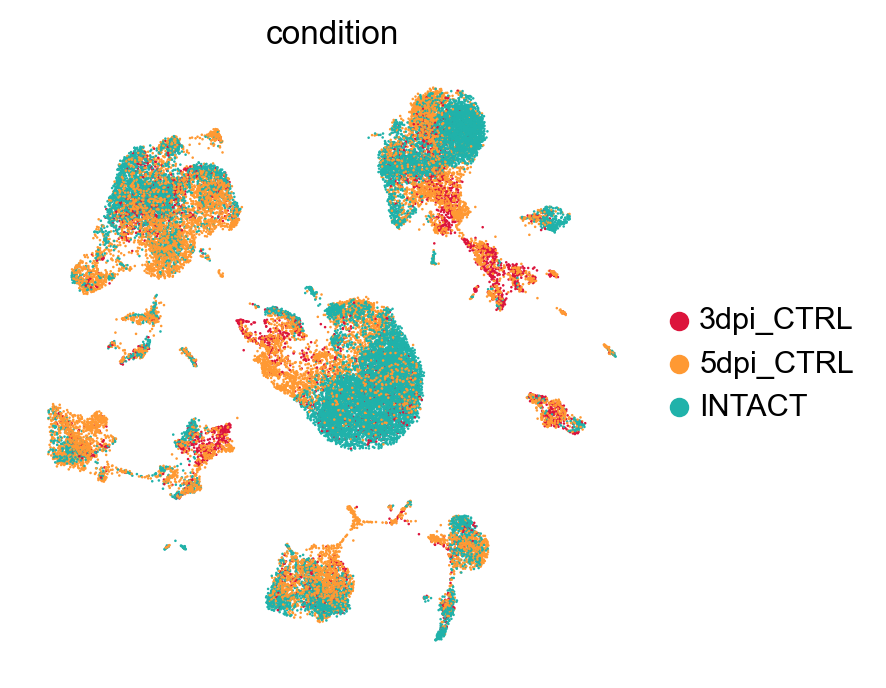

In [29]:
sc.pl.umap(adata_ctr_proc_2,color='condition',palette=con_cl, legend_fontweight= 'normal', frameon= False ,)

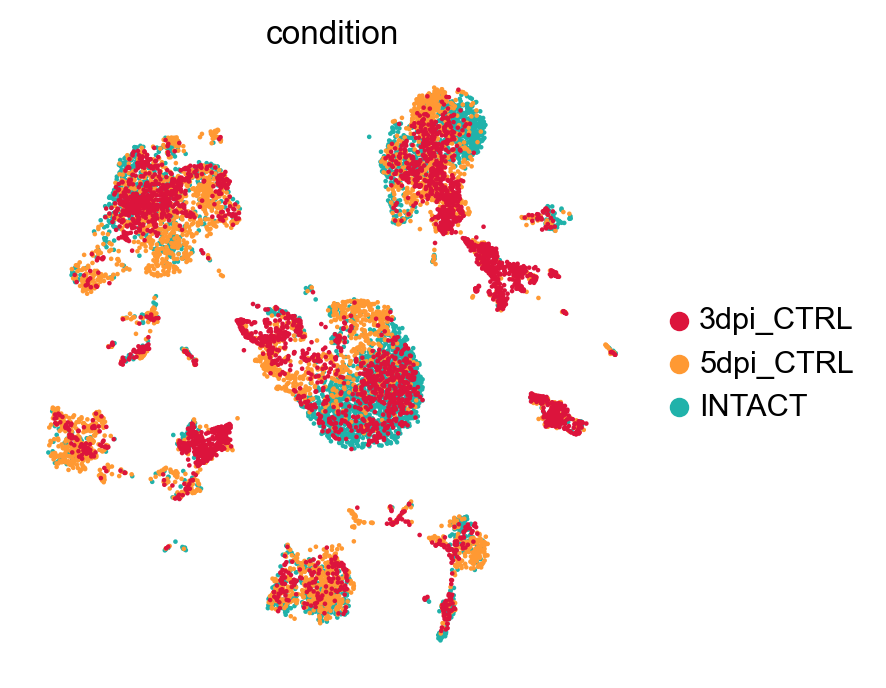

In [30]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition',palette=con_cl, legend_fontweight= 'normal', frameon= False ,)

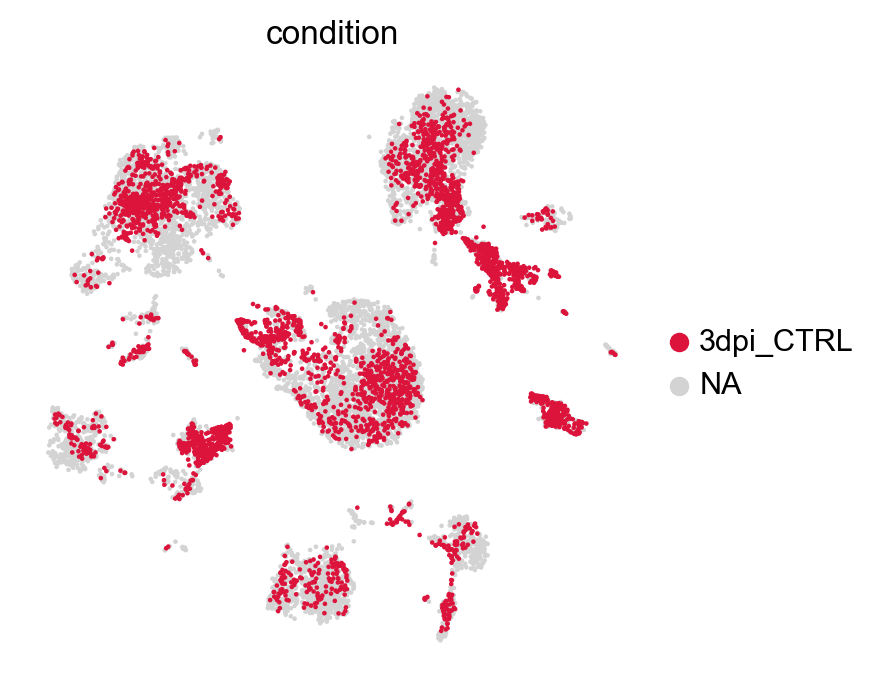

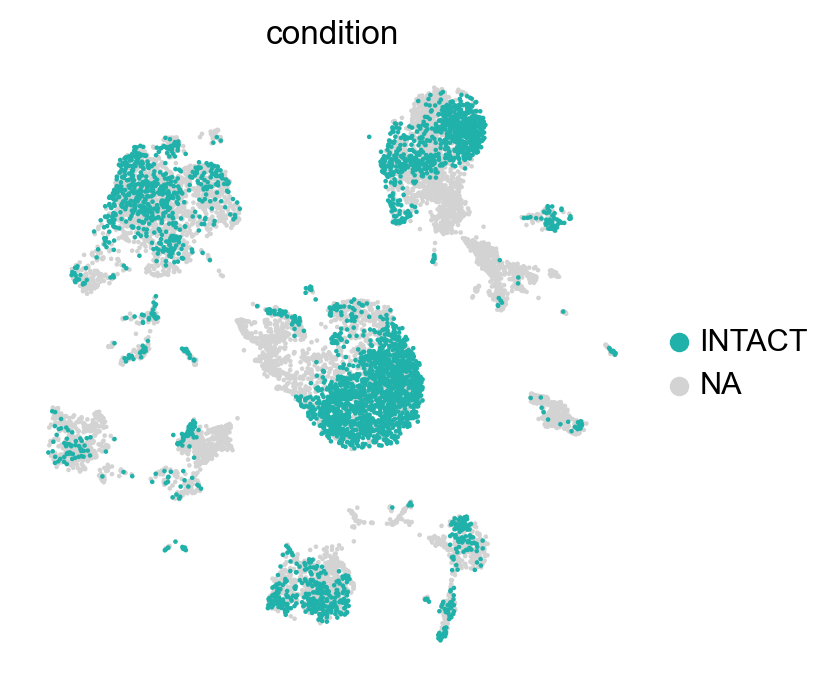

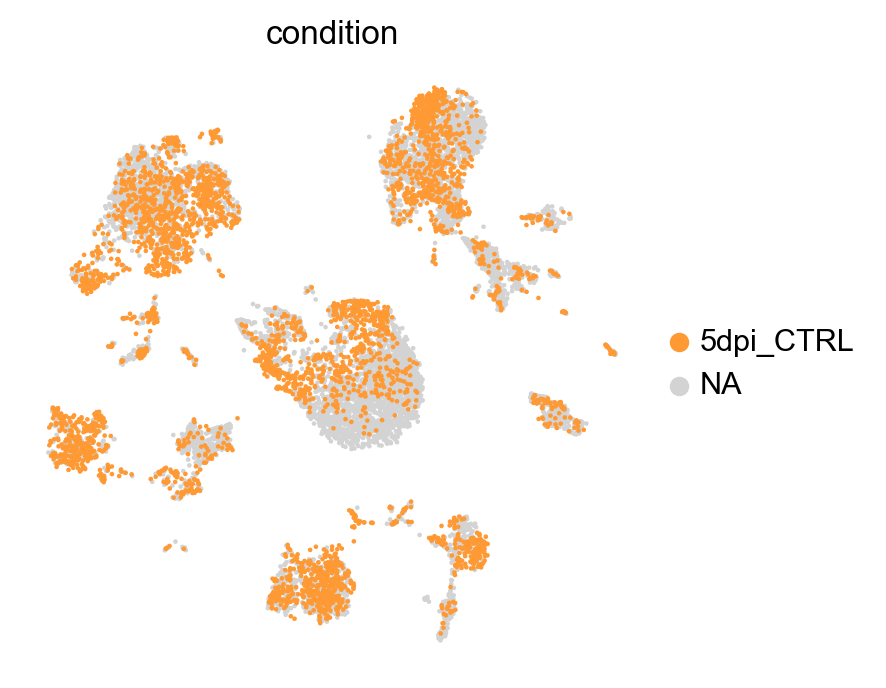

In [32]:
for i in set(adata_ctr_proc_2_subsam.obs['condition']):
    sc.pl.umap(adata_ctr_proc_2_subsam,color='condition',legend_fontweight= 'normal', frameon= False, groups=i,save=i+'downsampling.png')

## Cell cycle

In [33]:
cell_cycle_genes = [x.strip() for x in open('/Volumes/Seagate_Exp/Single_cell_112020/regev_lab_cell_cycle_genes_mouse.txt')]

In [39]:
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata_ctr_proc_2.var_names]

In [35]:
sc.tl.score_genes_cell_cycle(adata_ctr_proc_2, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    686 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    729 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


In [36]:
pair2= ["#009B77", "#ff8080", "#ffbf00", "#9AD255", "#9AD255",
       "#b30047",   "#dada2b", "#dada2b"]

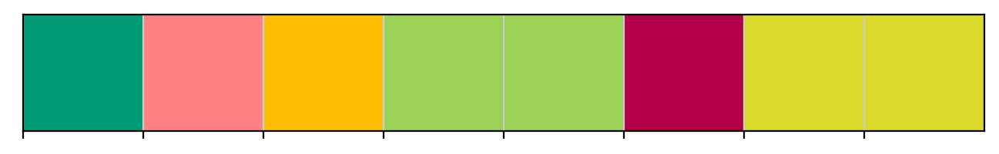

In [37]:
sb.palplot(pair2)

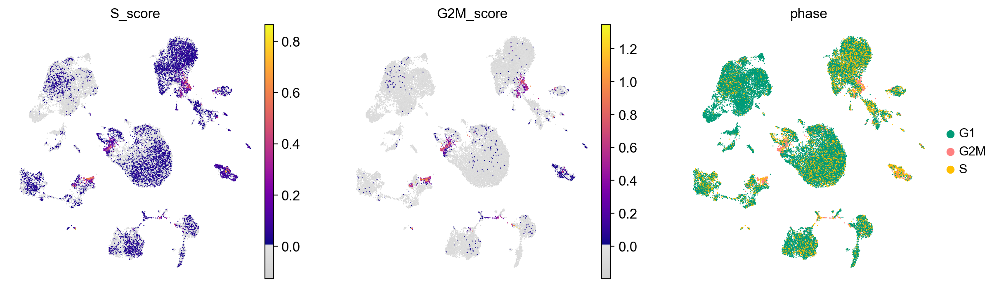

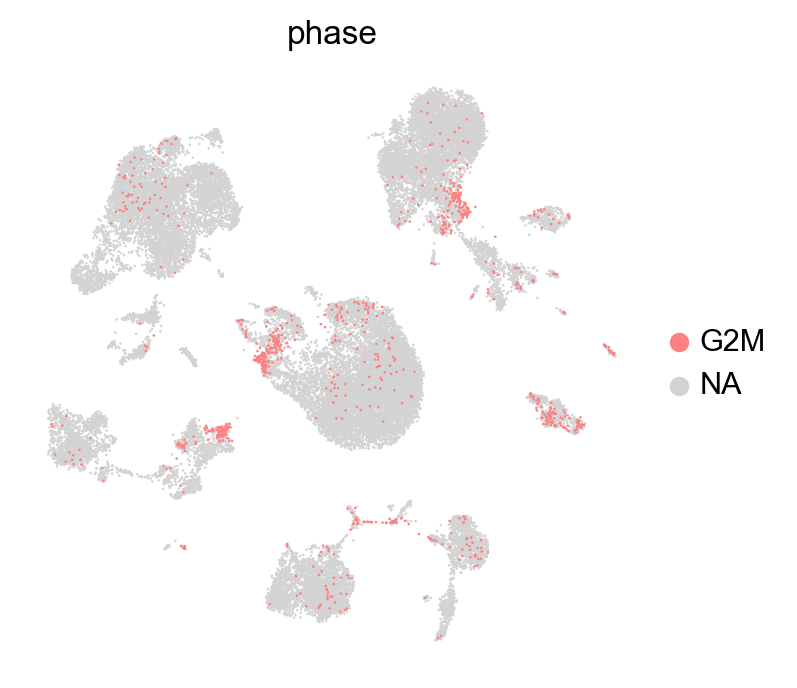

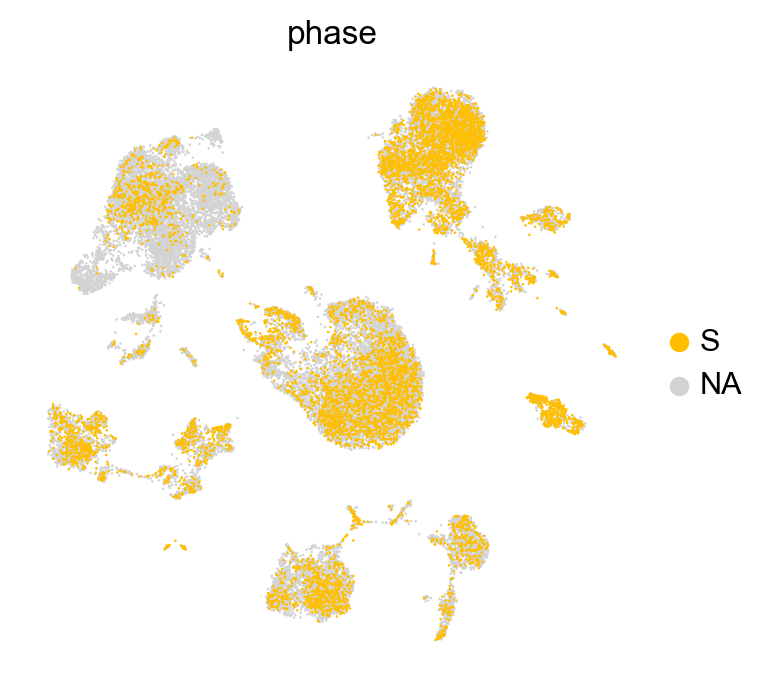

In [38]:
sc.pl.umap(adata_ctr_proc_2, color=['S_score', 'G2M_score', 'phase'],palette=pair2, use_raw=False, frameon=False, cmap=mymap2)
sc.pl.umap(adata_ctr_proc_2, color='phase',groups=['G2M'],  palette=pair2, use_raw=False, frameon=False)
sc.pl.umap(adata_ctr_proc_2, color='phase',groups=['S'],  palette=pair2, use_raw=False, frameon=False)

In [40]:
sc.tl.score_genes(adata_ctr_proc_2, list(cell_cycle_genes), score_name='Cycling cells' )

computing score 'Cycling cells'
    finished: added
    'Cycling cells', score of gene set (adata.obs).
    941 total control genes are used. (0:00:01)


In [41]:
sc.tl.score_genes(adata_ctr_proc_2, list(s_genes), score_name='S phase' )

computing score 'S phase'
    finished: added
    'S phase', score of gene set (adata.obs).
    848 total control genes are used. (0:00:01)


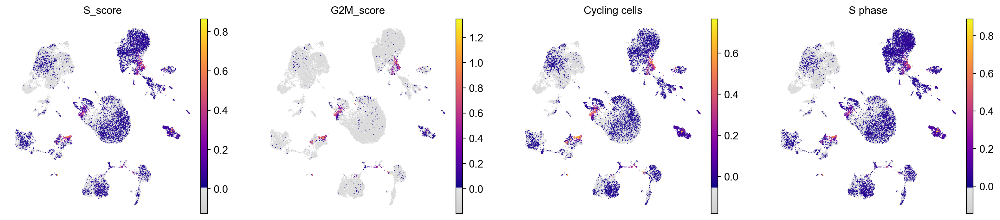

In [43]:
sc.pl.umap(adata_ctr_proc_2, color=['S_score', 'G2M_score', 'Cycling cells', 'S phase'],palette=pair2, use_raw=False, frameon=False, cmap=mymap2)

In [44]:
Ccc = adata_ctr_proc_2.obs['Cycling cells'] >0

In [45]:
Ccc

AAACCCACAACAGCTT    False
AAACCCACAGCGACCT    False
AAACCCATCCACCTCA    False
AAACCCATCCATCGTC    False
AAACCCATCTGAGAGG    False
                    ...  
TTTGTCATCACAATGC    False
TTTGTCATCCAACCAA    False
TTTGTCATCCTTGGTC    False
TTTGTCATCGATCCCT    False
TTTGTCATCTTGAGAC    False
Name: Cycling cells, Length: 35132, dtype: bool

In [46]:
adata_ctr_proc_2.obs['Cycling_cells'] = Ccc
adata_ctr_proc_2.obs['Cycling_cells'] = adata_ctr_proc_2.obs['Cycling_cells'].astype('category')

In [47]:
cluster2annotation = {
    False : 'resting',
    True : 'cycling',
 }

In [48]:
adata_ctr_proc_2.obs['Cycling_cells'] = adata_ctr_proc_2.obs['Cycling_cells'].map(cluster2annotation).astype('category')

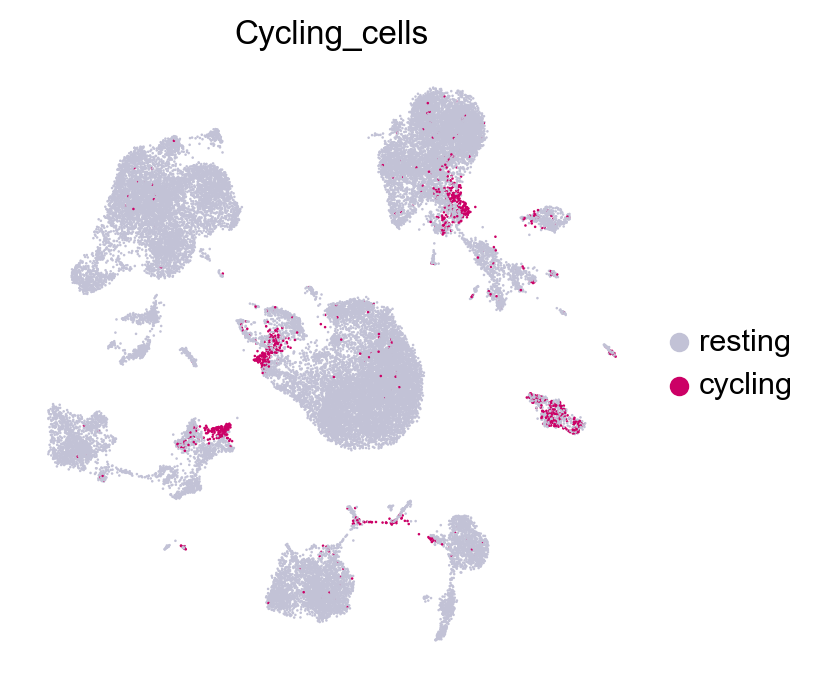

In [49]:
sc.pl.umap(adata_ctr_proc_2, color=['Cycling_cells'],palette=['#c2c2d6', '#cc0066'], use_raw=False, frameon=False, cmap=mymap2, vmin=0)

In [62]:
scells = adata_ctr_proc_2.obs['S phase'] >0.05

In [63]:
scells

AAACCCACAACAGCTT    False
AAACCCACAGCGACCT    False
AAACCCATCCACCTCA    False
AAACCCATCCATCGTC    False
AAACCCATCTGAGAGG    False
                    ...  
TTTGTCATCACAATGC    False
TTTGTCATCCAACCAA    False
TTTGTCATCCTTGGTC    False
TTTGTCATCGATCCCT    False
TTTGTCATCTTGAGAC    False
Name: S phase, Length: 35132, dtype: bool

In [64]:
adata_ctr_proc_2.obs['S_phase_cells'] = scells
adata_ctr_proc_2.obs['S_phase_cells'] = adata_ctr_proc_2.obs['S_phase_cells'].astype('category')

In [65]:
cluster2annotation = {
    False : 'NA',
    True : 'S phase',
 }

In [66]:
adata_ctr_proc_2.obs['S_phase_cells'] = adata_ctr_proc_2.obs['S_phase_cells'].map(cluster2annotation).astype('category')

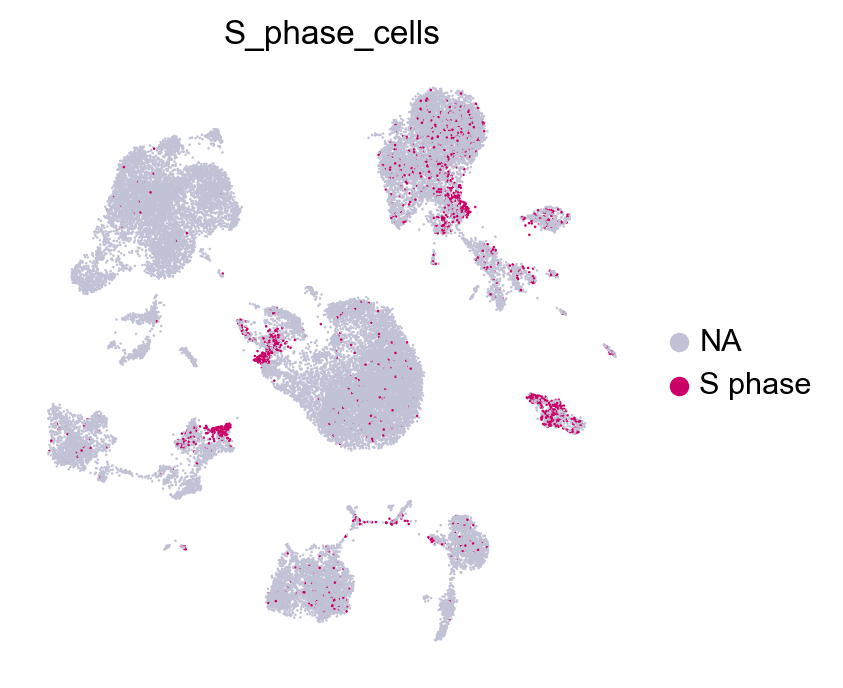

In [67]:
sc.pl.umap(adata_ctr_proc_2, color=['S_phase_cells'],palette=['#c2c2d6', '#cc0066'], use_raw=False, frameon=False, cmap=mymap2, vmin=0)

# Markers analysis

In [68]:
Markers_all_cells ={'Microglia': ['Tmem119', 'Cx3cr1', 'P2ry12', 'P2ry13', 'Gpr34', 'Olfml3', 'Selplg', 'Sparc', 'Fcrls', 'Siglech', 'Slc2a5','Mafb', 'Pmepa1', 'Cd14'],
                   'DAM':['Lpl','Cst7'], 
                   'Macrophages':['Itga4', 'Tgfbi', 'Ifitm2', 'Ifitm3', 'Tagln2','F13a1', 'Kynu', 'S100a11', 'S100a6'],
                   'BAM': [ 'Cd163', 'Mrc1','Lyve1', 'Siglec1'],
                   'Monocytes':['Ly6c2','Ccr2','Spn'],
                   'DCs':['Cd24a','Itgax','Bst2','Cd209a','Xcr1','Ccr7','Ccr9', 'Flt3','Itgae', 'Itgam','H2-Oa','Tnni2','Kctd14','Amica1','Kmo','Hepacam2'], 
                   'NKT cells':['Cd3e','Klrb1c','Ncr1'],
                   'T cells':['Cd3d','Cd3e','Cd3g','Lat','Bcl11b'],
                   'B cells':['Cd19', 'Ms4a1', 'Sdc1', 'Pax5', 'Ms4a1'],
                   'Neutrophils': ['S100a9'],
                   'Neurons':['Rbfox3','Slc17a7','Gabra1', 'Cux1','Pou3f2','Bcl11b', 'Foxp2'],
                   'OPCs':['Pdgfra', 'C1ql1'],
                   'COPs':['Neu4', 'Brca1'],
                   'MOL':['Opalin', 'Ninj2'],
                   'Astrocytes':['Sox9', 'Gfap','Aldh1l1','Atp1b2', 'Vim','Gfap','Slc1a3','Aldoc'],
                   'Pericytes':['Pecam1','Pdgfrb', 'Higd1b','Ndufa4l2','Rgs5','Kcnj8','Flt1'],
                   'VSMCs':['Acta2', 'Tagln','Myh11', 'Mustn1','Map3k7cl'],
                   'VLMCs':['Mgp', 'Slc47a1',  'Thbd', 'Col1a1', 'Col1a2'],
                   'VECV': ['Ly6c1','Cldn5', 'Ly6a','Pltp','Pglyrp1', 'Scgb3a1']
                  }#Ochocka et al., 2021, van Hove et al., 2016, Zeisel et al. 2018

In [69]:
for names in list(Markers_all_cells):
    sc.tl.score_genes(adata_ctr_proc_2, Markers_all_cells[names], score_name=names )

computing score 'Microglia'
    finished: added
    'Microglia', score of gene set (adata.obs).
    249 total control genes are used. (0:00:01)
computing score 'DAM'
    finished: added
    'DAM', score of gene set (adata.obs).
    100 total control genes are used. (0:00:01)
computing score 'Macrophages'
    finished: added
    'Macrophages', score of gene set (adata.obs).
    350 total control genes are used. (0:00:01)
computing score 'BAM'
    finished: added
    'BAM', score of gene set (adata.obs).
    150 total control genes are used. (0:00:01)
computing score 'Monocytes'
    finished: added
    'Monocytes', score of gene set (adata.obs).
    150 total control genes are used. (0:00:01)
computing score 'DCs'
    finished: added
    'DCs', score of gene set (adata.obs).
    550 total control genes are used. (0:00:01)
computing score 'NKT cells'
    finished: added
    'NKT cells', score of gene set (adata.obs).
    100 total control genes are used. (0:00:01)
computing score 'T cells

In [70]:
adata_ctr_proc_2

AnnData object with n_obs × n_vars = 35132 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden_ctr', 'leiden_ctr07', 'leiden_ctr2', 'S_score', 'G2M_score', 'phase', 'Cycling cells', 'S phase', 'Cycling_cells', 'S_phase_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DCs', 'NKT cells', 'T cells', 'B cells', 'Neutrophils', 'Neurons', 'OPCs', 'COPs', 'MOL', 'Astrocytes', 'Pericytes', 'VSMCs', 'VLMCs', 'VECV'
    var: 'gene_ids', 'feature_types', 'n_cells_by_counts', 'mean_counts', 'log1p_mea

In [71]:
#Calculate marker genes check for 100 use raw data for markers
sc.tl.rank_genes_groups(adata_ctr_proc_2, groupby='leiden_ctr', key_added='rank_genes_ctr_r1', method='t-test_overestim_var')

ranking genes
    finished: added to `.uns['rank_genes_ctr_r1']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:23)


    using 'X_pca' with n_pcs = 9
Storing dendrogram info using `.uns['dendrogram_leiden_ctr']`


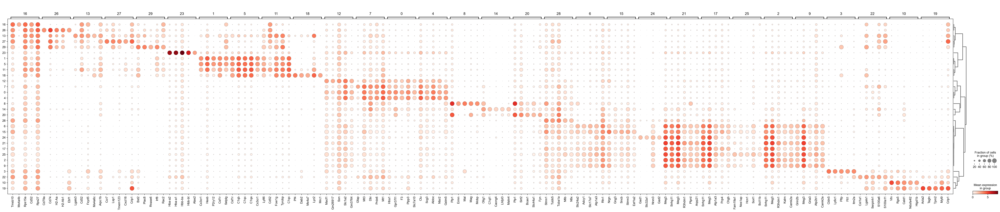

In [72]:
#it uses adata_main_correct.raw which is set to adata, so the results should be similar to the mgs from adata that I think they are
sc.pl.rank_genes_groups_dotplot(adata_ctr_proc_2, n_genes=5, key='rank_genes_ctr_r1' )

In [73]:
mg = []
scores = []
for i in range(0,30):
    mg = [j[i] for j in adata_ctr_proc_2.uns['rank_genes_ctr_r1']['names']][:20]
    scores = [j[i] for j in adata_ctr_proc_2.uns['rank_genes_ctr_r1']['scores']][:20]
    print('marker genes in louvain cluster: ' + str(i))
    for j in range (0,len(mg)):
        print(mg[j])
    print('-----------------')

marker genes in louvain cluster: 0
Htra1
Gpr37l1
F3
Plpp3
Slc7a10
Slc1a3
Bcan
Aldoc
Gja1
Cxcl14
Mfge8
Cldn10
Ntsr2
Btbd17
Gjb6
Atp1a2
Ndrg2
Msmo1
Clu
Mt3
-----------------
marker genes in louvain cluster: 1
Cx3cr1
Hexb
P2ry12
Csf1r
Selplg
C1qa
Trem2
C1qc
C1qb
Gpr34
Siglech
Tmem119
Ctss
Laptm5
Olfml3
Fcrls
Lpcat2
Vsir
Lgmn
Fcgr3
-----------------
marker genes in louvain cluster: 2
Snhg11
Meg3
R3hdm1
Kalrn
Camk2a
Ptprd
Arpp21
Brinp3
Syt1
Atp1a1
Rtn1
mt-Nd1
2900055J20Rik
Pcsk2
Atp2b2
A830036E02Rik
C1qtnf4
Syp
Snap25
Grin2b
-----------------
marker genes in louvain cluster: 3
Cldn5
Ly6c1
Pltp
Flt1
Itm2a
Ly6a
Slco1a4
Bsg
Egfl7
Slc2a1
Pglyrp1
Adgrl4
Esam
Ramp2
Abcb1a
Spock2
Hspb1
Igfbp7
Pecam1
Vwa1
-----------------
marker genes in louvain cluster: 4
Clu
Scg3
Aldoc
Ntsr2
Gstm5
Slc1a3
Cldn10
Gja1
Mt3
Plpp3
Pla2g7
Mt1
Id4
Prdx6
Pantr1
Mt2
Apoe
Cpe
Slc1a2
Aqp4
-----------------
marker genes in louvain cluster: 5
Csf1r
C1qb
C1qc
C1qa
Cx3cr1
Hexb
Ctss
Cd83
Ccl4
Trem2
Atf3
P2ry12
Rgs10
Ccl3
Laptm5

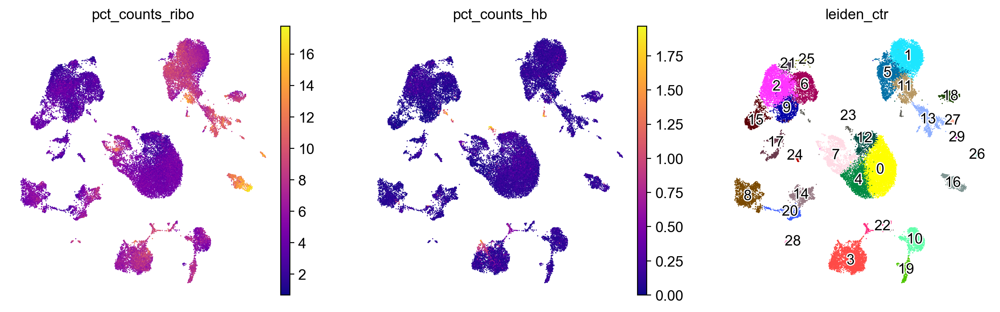

In [75]:
sc.pl.umap(adata_ctr_proc_2,color=['pct_counts_ribo', 'pct_counts_hb', 'leiden_ctr'],legend_fontweight= 'normal',legend_loc='on data', frameon= False , legend_fontoutline=2)

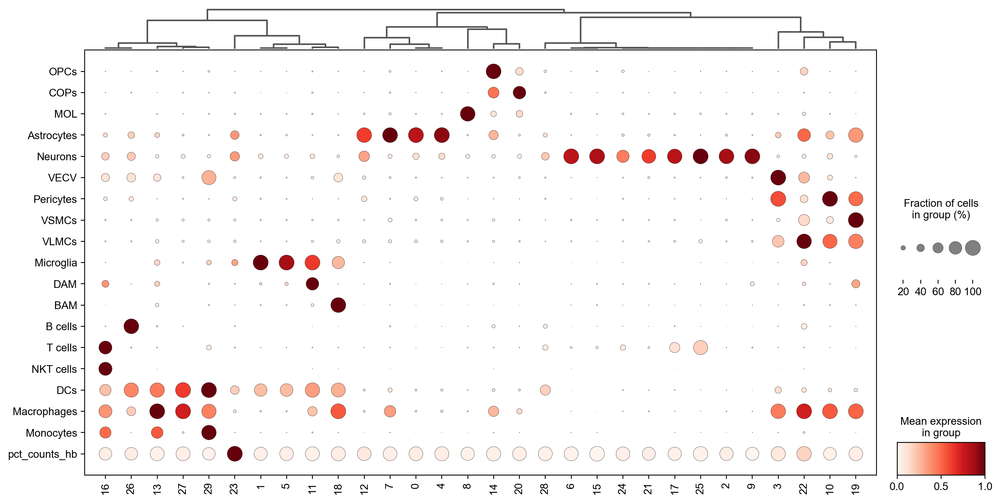

In [76]:
sc.pl.dotplot(adata_ctr_proc_2, ['OPCs','COPs', 'MOL',  'Astrocytes', 'Neurons','VECV','Pericytes', 'VSMCs', 'VLMCs',  'Microglia', 'DAM', 'BAM', 'B cells', 'T cells', 'NKT cells', 
                                    'DCs','Macrophages', 'Monocytes', 'pct_counts_hb'], 'leiden_ctr',  standard_scale='var', swap_axes=True, figsize=(15,8),
              var_group_rotation=90, dendrogram=True,)# save='markers_3dpi.png')

In [78]:
cluster2annotation = {'0': '0_Astrocytes',
                      '1': '1_Microglia',
                      '2': '2_Neurons',
                      '3': '3_VEC',
                      '4': '4_Astrocytes',
                      '5': '5_Microglia',
                      '6': '6_Neurons',
                      '7': '7_Astrocytes',
                      '8': '8_MOL',
                      '9': '9_Neurons',
                      '10': '10_Pericytes',
                      '11': '11_Microglia',
                      '12': '12_Astrocytes',
                      '13': '13_Macrophages/Monocytes',
                      '14': '14_OPCs',
                      '15': '15_Neurons',
                      '16': '16_NKT/T cells',
                      '17': '17_Neurons',
                      '18': '18_BAM',
                      '19': '19_VSMCs',
                      '20': '20_COPs',
                      '21': '21_Neurons',
                      '22': '22_VLMCs',
                      '23': '23_NA',
                      '24': '24_Neurons',
                      '25': '25_Neurons',
                      '26': '26_B cells',
                      '27': '27_Macrophages/Monocytes', 
                      '28': '28_NA',
                      '29': '29_Macrophages/Monocytes'
}

In [79]:
adata_ctr_proc_2.obs['annotated'] = adata_ctr_proc_2.obs['leiden_ctr'].map(cluster2annotation).astype('category')

In [80]:
adata_ctr_proc_2.obs['annotated'].value_counts()

0_Astrocytes                6089
1_Microglia                 3835
2_Neurons                   3487
3_VEC                       2927
4_Astrocytes                2215
5_Microglia                 1986
6_Neurons                   1537
7_Astrocytes                1474
8_MOL                       1472
9_Neurons                   1185
10_Pericytes                1126
11_Microglia                1044
12_Astrocytes                971
13_Macrophages/Monocytes     809
14_OPCs                      735
15_Neurons                   716
16_NKT/T cells               585
17_Neurons                   548
18_BAM                       413
19_VSMCs                     408
20_COPs                      407
21_Neurons                   302
22_VLMCs                     226
23_NA                        132
24_Neurons                   128
25_Neurons                   117
26_B cells                    95
27_Macrophages/Monocytes      62
28_NA                         51
29_Macrophages/Monocytes      50
Name: anno

In [81]:
cluster2annotationg = {'0': 'Astrocytes',
                      '1': 'Microglia',
                      '2': 'Neurons',
                      '3': 'VEC',
                      '4': 'Astrocytes',
                      '5': 'Microglia',
                      '6': 'Neurons',
                      '7': 'Astrocytes',
                      '8': 'MOL',
                      '9': 'Neurons',
                      '10': 'Pericytes',
                      '11': 'Microglia',
                      '12': 'Astrocytes',
                      '13': 'Macrophages/Monocytes',
                      '14': 'OPCs',
                      '15': 'Neurons',
                      '16': 'NKT/T cells',
                      '17': 'Neurons',
                      '18': 'BAM',
                      '19': 'VSMCs',
                      '20': 'COPs',
                      '21': 'Neurons',
                      '22': 'VLMCs',
                      '23': 'NA',
                      '24': 'Neurons',
                      '25': 'Neurons',
                      '26': 'B cells',
                      '27': 'Macrophages/Monocytes', 
                      '28': 'NA',
                      '29': 'Macrophages/Monocytes'
}

In [82]:
adata_ctr_proc_2.obs['annotatedgroup'] = adata_ctr_proc_2.obs['leiden_ctr'].map(cluster2annotationg).astype('category')

In [83]:
adata_ctr_proc_2.obs['annotatedgroup'].value_counts()

Astrocytes               10749
Neurons                   8020
Microglia                 6865
VEC                       2927
MOL                       1472
Pericytes                 1126
Macrophages/Monocytes      921
OPCs                       735
NKT/T cells                585
BAM                        413
VSMCs                      408
COPs                       407
VLMCs                      226
NA                         183
B cells                     95
Name: annotatedgroup, dtype: int64

In [84]:
adata_ctr_proc_2.obs['annotated'].value_counts()

0_Astrocytes                6089
1_Microglia                 3835
2_Neurons                   3487
3_VEC                       2927
4_Astrocytes                2215
5_Microglia                 1986
6_Neurons                   1537
7_Astrocytes                1474
8_MOL                       1472
9_Neurons                   1185
10_Pericytes                1126
11_Microglia                1044
12_Astrocytes                971
13_Macrophages/Monocytes     809
14_OPCs                      735
15_Neurons                   716
16_NKT/T cells               585
17_Neurons                   548
18_BAM                       413
19_VSMCs                     408
20_COPs                      407
21_Neurons                   302
22_VLMCs                     226
23_NA                        132
24_Neurons                   128
25_Neurons                   117
26_B cells                    95
27_Macrophages/Monocytes      62
28_NA                         51
29_Macrophages/Monocytes      50
Name: anno

In [85]:
color2=['#333399',#'0': 'Astrocytes',
        '#DC143C',#'1':'Microglia',
        '#008000',#'2': 'Neurons',
        '#BA55D3',#'3': 'VECV',
        '#0066cc',#'4': 'Astrocytes',
        '#fa6352',#'5': 'Microglia',
        '#9AD255',#'6': 'Neurons',
        '#b3d9ff',#'8: 'Astrocytes',
        '#fdd2ce',#'7': 'MOL',
        '#20B2AA',#'9': 'Neurons',
        '#9985e0',#'12': 'Pericytes',
        '#ffb399',#'11': 'Microglia',
        '#bdcbf5',#'10': 'Astrocytes',
        '#cc3333',#'13': 'Monocytes',
        '#e6007a',#'14': 'OPCs',
        '#8dd593',#'15': 'Neurons',
        '#ff6600',#'16': 'NKT/T cells',
        '#006666',#'17': 'Neurons',     
        '#801a00',#'19': 'BAM',
        '#DA0AD3',#'20': 'VSMCs',
        '#ffb3db',#'18': 'COPs',
        '#99ffbb',#'21': 'Neurons', 
        '#d279a6',#'22': 'VLMCs',
        '#efd6f5',#'23': '24_Erythrocytes',
        '#326732',#'24': 'Neurons',
        '#20B2AA',#'25': 'Neurons',
        '#8e063b',#'26': 'B cells',
        '#ff8c00',#'27': 'DC',
        '#996600',#'28': 'Neurons',
        '#ffbf00',#'29': 'Monocytes',
       ]

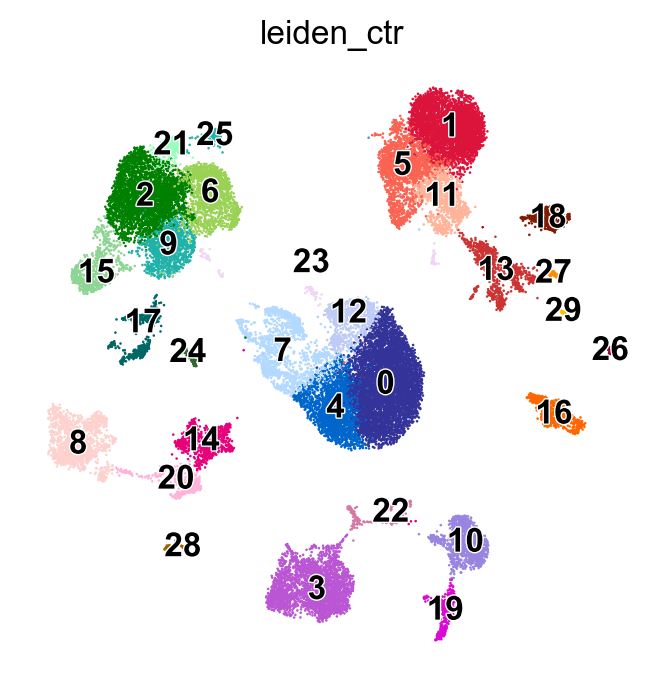

In [88]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['leiden_ctr'], legend_fontsize =float(12) , wspace=0.6, cmap=mymap2,palette=color2,legend_loc='on data',
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1, save=today+'_leiden_ctrl.pdf' )

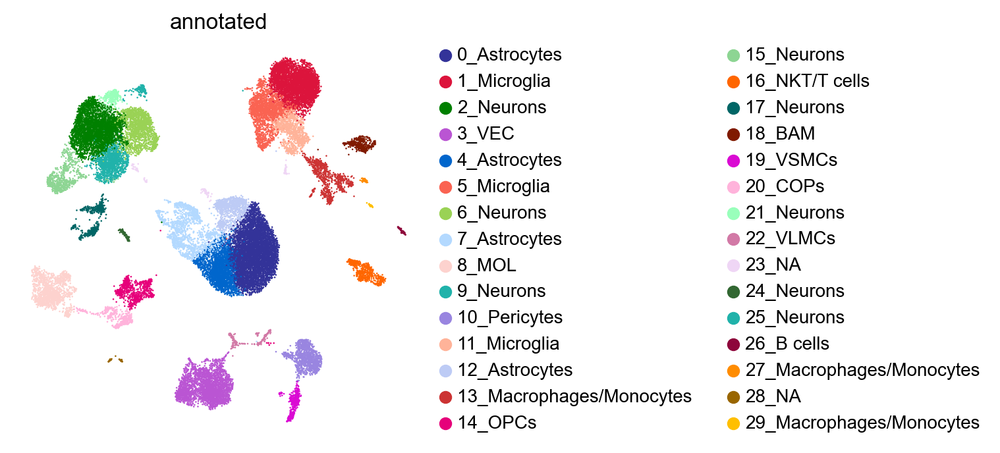

In [89]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['annotated'], legend_fontsize =float(10) , wspace=0.6, cmap=mymap2,palette=color2,
           legend_fontweight= 'bold', frameon= False , legend_fontoutline=1,save=today+'_annotated_ctrl.pdf' )

In [90]:
adata_ctr_proc_2.write(data_dir+today + "adata_ctr_proc_2_scVI.h5ad", compression='gzip') #

In [91]:
today + "adata_ctr_proc_2_scVI.h5ad"

'230721adata_ctr_proc_2_scVI.h5ad'

# Plots for figures

In [93]:
adata_ctr_proc_2 =  sc.read(data_dir+'230721adata_ctr_proc_2_scVI.h5ad')

In [95]:
adata_ctr_proc_2


AnnData object with n_obs × n_vars = 35132 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden_ctr', 'leiden_ctr07', 'leiden_ctr2', 'S_score', 'G2M_score', 'phase', 'Cycling cells', 'S phase', 'Cycling_cells', 'S_phase_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DCs', 'NKT cells', 'T cells', 'B cells', 'Neutrophils', 'Neurons', 'OPCs', 'COPs', 'MOL', 'Astrocytes', 'Pericytes', 'VSMCs', 'VLMCs', 'VECV', 'annotated', 'annotatedgroup'
    var: 'gene_ids', 'feature_types', 'n_cells_by_cou

In [96]:
sc.set_figure_params(scanpy=True, dpi=100, dpi_save=300,transparent=True, fontsize=14, color_map=mymap2)
plt.rcParams['figure.figsize']=(4,5) #rescale figures

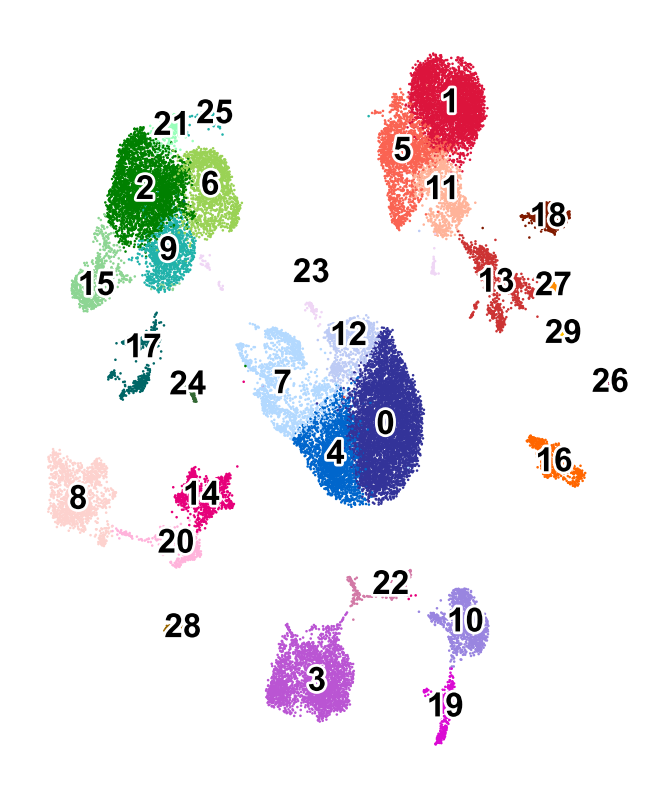

In [97]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['leiden_ctr'], legend_fontsize = float(12) , wspace=0.6, cmap=mymap2,title='',
           legend_fontweight= 'bold', frameon= False , legend_loc='on data', legend_fontoutline=2,save='_leiden_ctr.pdf' )

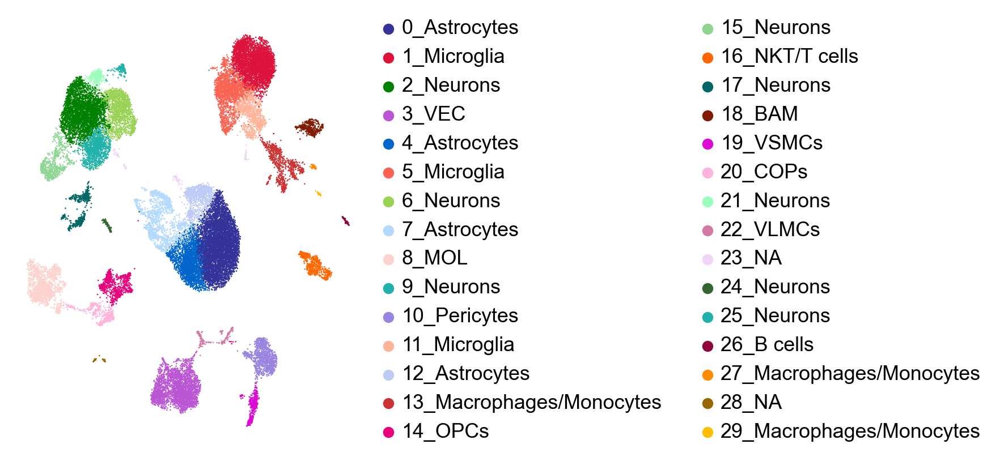

In [98]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['annotated'], wspace=0.6, cmap=mymap2,title='',
           legend_fontweight= 'normal', frameon= False, save='_scVI_ctrl_annotated.pdf')

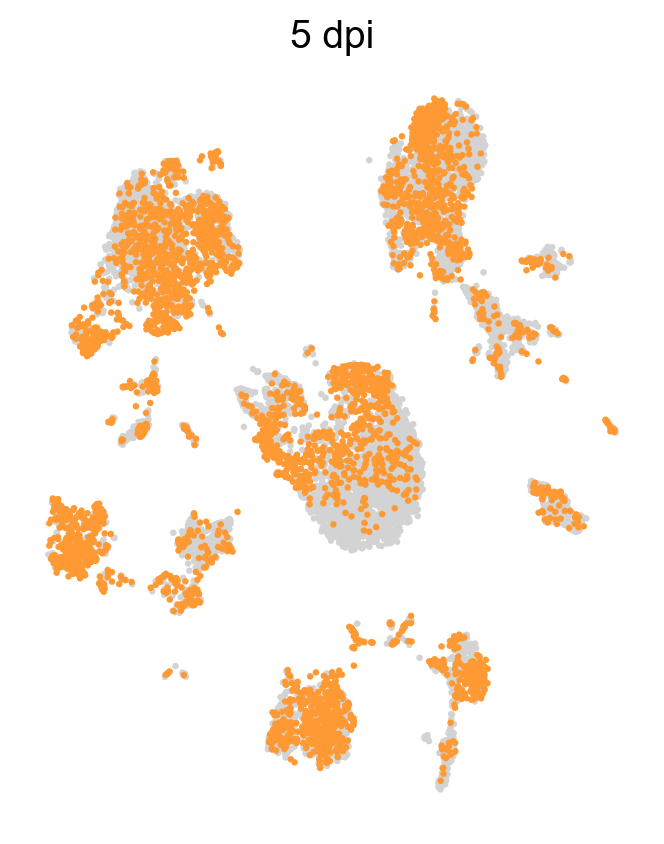

In [103]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition', groups='5dpi_CTRL',legend_fontsize =float(20) ,legend_loc='',title='5 dpi',size=22, frameon= False ,save='_scI_5dpi_ctrl.pdf')

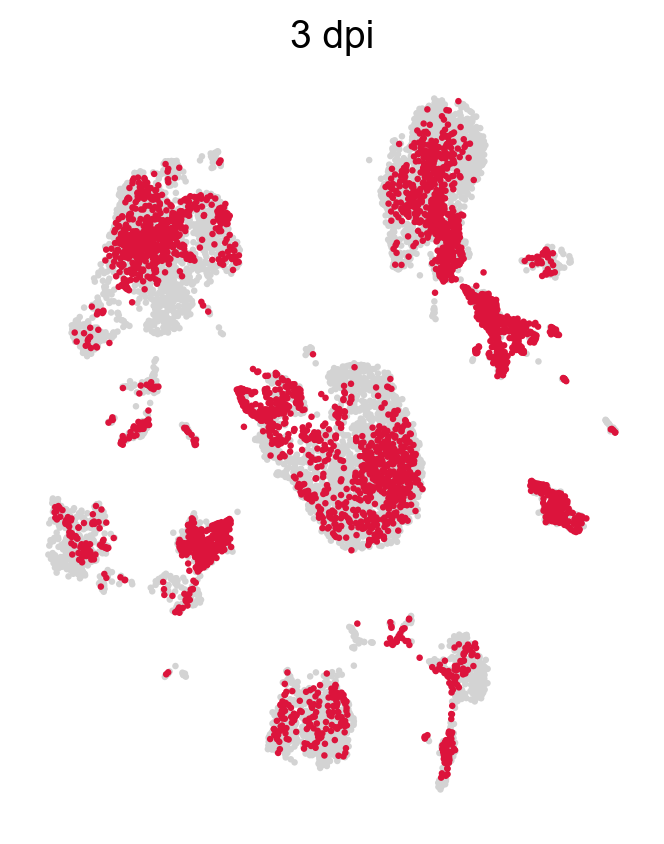

In [104]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition', groups='3dpi_CTRL',legend_loc='',title='3 dpi',size=22, frameon= False ,save='_scI_3dpi_ctrl.pdf')

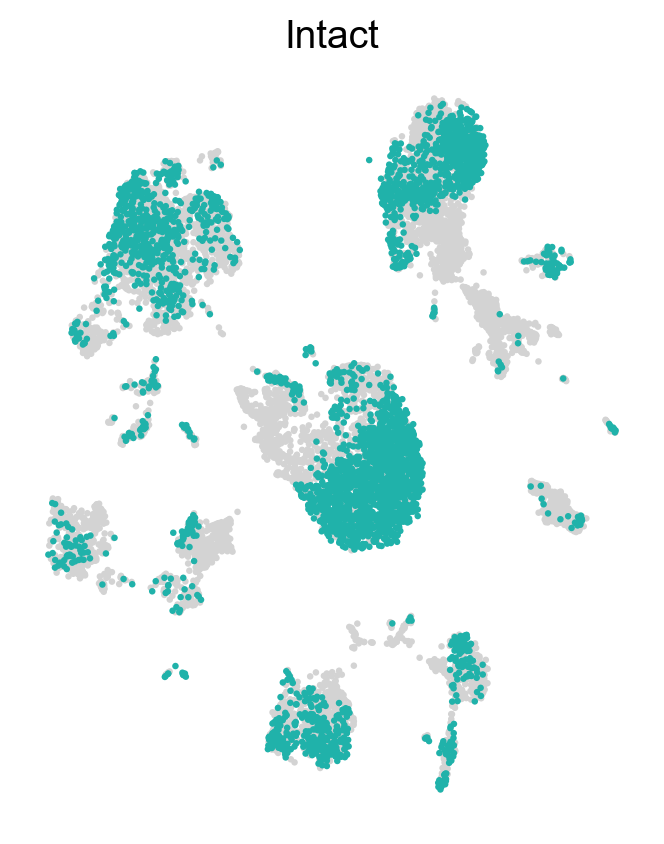

In [105]:
sc.pl.umap(adata_ctr_proc_2_subsam,color='condition', groups='INTACT',  legend_loc='',title='Intact',size=22, frameon= False ,save='_Intact_ctrl.pdf')

In [102]:
#Calculate marker genes check for 100 use raw data for markers
sc.tl.rank_genes_groups(adata_ctr_proc_2, groupby='annotated', key_added='rank_genes_annotated', method='t-test_overestim_var', use_raw=True)

ranking genes
    finished: added to `.uns['rank_genes_annotated']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:29)


    using 'X_pca' with n_pcs = 9
Storing dendrogram info using `.uns['dendrogram_annotated']`


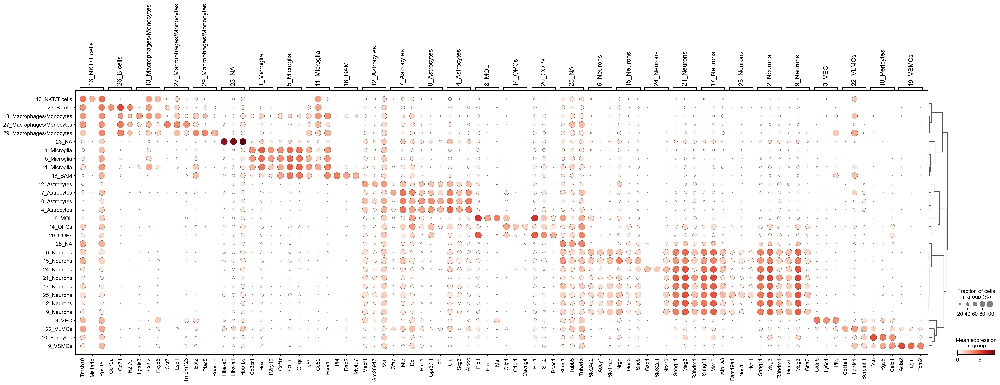

In [106]:
#it uses adata_main_correct.raw which is set to adata, so the results should be similar to the mgs from adata that I think they are
sc.pl.rank_genes_groups_dotplot(adata_ctr_proc_2, n_genes=3, key='rank_genes_annotated', save='_scVI_ctrl_annotated.pdf')

In [107]:
result = adata_ctr_proc_2.uns['rank_genes_annotated']
groups = result['names'].dtype.names
adata_annotated_genes = pd.DataFrame(
    {group + '_' + key[:1]: result[key][group]
    for group in groups for key in ['names','scores', 'pvals','logfoldchanges']})

In [108]:
adata_annotated_genes

,0_Astrocytes_n,0_Astrocytes_s,0_Astrocytes_p,0_Astrocytes_l,1_Microglia_n,1_Microglia_s,1_Microglia_p,1_Microglia_l,2_Neurons_n,2_Neurons_s,...,27_Macrophages/Monocytes_p,27_Macrophages/Monocytes_l,28_NA_n,28_NA_s,28_NA_p,28_NA_l,29_Macrophages/Monocytes_n,29_Macrophages/Monocytes_s,29_Macrophages/Monocytes_p,29_Macrophages/Monocytes_l
0,Htra1,186.064301,0.0,4.837433,Cx3cr1,179.837173,0.0,6.029654,Snhg11,138.600571,...,1.575725e-53,10.958855,Stmn1,16.068531,7.054215e-25,3.969420,Bst2,30.129145,2.497149e-39,6.308561
1,Gpr37l1,179.317307,0.0,5.034392,Hexb,172.401260,0.0,6.454156,Meg3,131.473648,...,2.290547e-73,7.840065,Tubb5,14.281250,8.096374e-26,3.838081,Plac8,29.384186,1.744984e-45,8.933779
2,F3,169.711166,0.0,4.865520,P2ry12,168.280609,0.0,6.163699,R3hdm1,111.811844,...,4.225878e-68,7.133900,Tuba1a,12.286259,1.618514e-21,3.552332,Rnase6,27.851105,1.304731e-35,8.390790
3,Plpp3,168.327026,0.0,4.855903,Csf1r,167.443420,0.0,5.807939,Kalrn,106.517487,...,3.480773e-60,6.375915,Nfib,10.676394,3.971167e-18,3.311277,Irf8,23.367680,7.593090e-40,5.963866
4,Slc7a10,162.926102,0.0,4.766245,Selplg,157.205048,0.0,5.812582,Camk2a,98.248886,...,4.404093e-52,7.177729,Nfix,10.628957,4.180770e-18,3.011566,Rac2,21.343250,2.644425e-38,5.441374
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19285,Calm2,-65.827042,0.0,-1.791566,Sparcl1,-64.333275,0.0,-3.667198,Sepp1,-65.297897,...,5.980881e-16,-2.496786,Slc1a2,-6.330639,3.182030e-08,-3.712725,Glul,-7.031676,1.561611e-09,-3.652436
19286,Ly6e,-76.001373,0.0,-4.670836,mt-Co1,-65.047226,0.0,-1.916648,Cst3,-65.436882,...,3.371923e-16,-3.570929,mt-Nd4,-6.350672,1.231990e-08,-1.508547,Prnp,-7.085016,1.494234e-09,-3.453229
19287,Mef2c,-76.628593,0.0,-3.286598,Prnp,-66.319336,0.0,-3.509622,Cd63,-66.179886,...,7.545929e-18,-2.986211,mt-Cytb,-6.528580,5.920142e-09,-1.473652,Ptn,-7.170723,1.186457e-09,-3.559419
19288,App,-78.975571,0.0,-3.394570,Ptn,-69.219185,0.0,-3.802535,Glul,-67.292587,...,4.099941e-19,-2.759566,Ptn,-6.690423,5.404871e-09,-3.216116,Ckb,-7.616718,3.778084e-11,-2.680575


In [109]:
adata_annotated_genes.to_csv(table_dir+today+'adata_annotated_genes_ctrl.csv')

    using 'X_pca' with n_pcs = 9
Storing dendrogram info using `.uns['dendrogram_condition']`


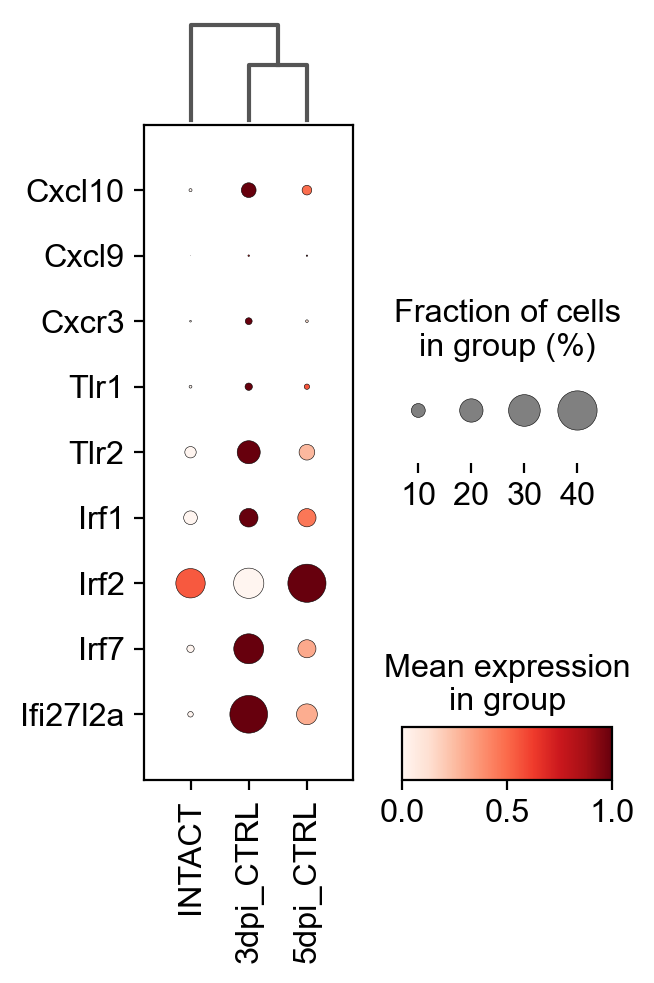

In [110]:
sc.pl.dotplot(adata_ctr_proc_2, var_names=['Cxcl10', 'Cxcl9', 'Cxcr3', 'Tlr1', 'Tlr2', 'Irf1', 'Irf2', 'Irf7', 'Ifi27l2a'], groupby='condition', swap_axes=True,standard_scale='var', dendrogram=True,figsize=(3,5),  save='_scI_tlr2cxcr3.pdf')

In [111]:
common_innate_immunity=[ 'Ifi47', 'Iigp1', 'Mdfic', 'Top2a', 'Dynlt1a', 'Lgals1', 'Cxcl10', 'Oasl1', 'Zbp1', 'Dhx58', 'Trim25', 'Rsad2',
                        'Slfn9', 'Oas1a', 'Ifitm2', 'Bcl3', 'Ifi27l2a', 'Oasl2', 'Irf7','Ifit1', 'Bst2', 'Isg15', 'Ifit3b', 'Ifit3','Ifitm3','Rtp4'
                       ]

In [112]:
sc.tl.score_genes(adata_ctr_proc_2, common_innate_immunity, score_name='common_innate_immunity_signature')

computing score 'common_innate_immunity_signature'
    finished: added
    'common_innate_immunity_signature', score of gene set (adata.obs).
    649 total control genes are used. (0:00:01)


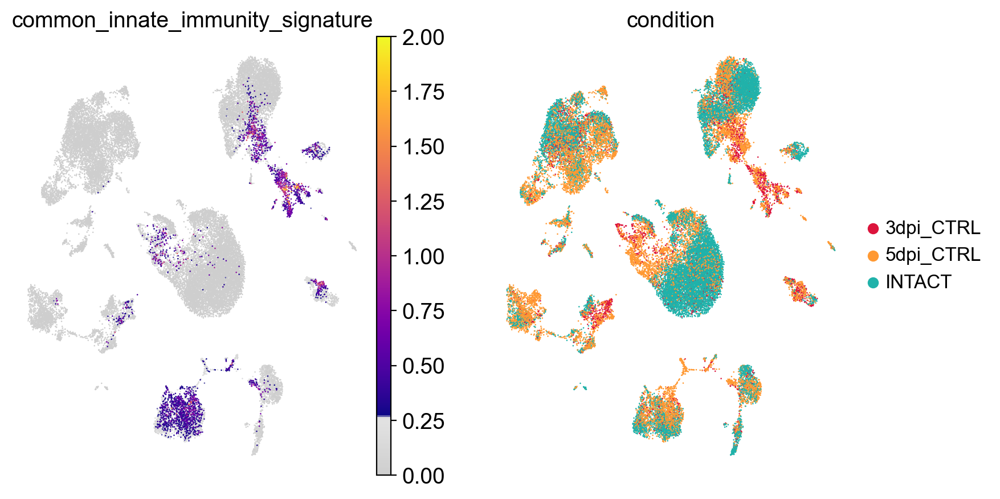

In [113]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['common_innate_immunity_signature', 'condition'],legend_fontsize =float(12), cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False , save='innate_immune_signature.pdf' )

In [114]:
data_infmarkscore = pd.DataFrame({'condition': list(adata_ctr_proc_2.obs['condition']),
                               'cell type':list(adata_ctr_proc_2.obs['annotated']),
                               'infmark':np.array(adata_ctr_proc_2.obs['common_innate_immunity_signature'])
                              })

In [115]:
data_infmarkscore

,condition,cell type,infmark
0,5dpi_CTRL,3_VEC,0.349778
1,5dpi_CTRL,20_COPs,-0.130628
2,5dpi_CTRL,4_Astrocytes,-0.194064
3,5dpi_CTRL,6_Neurons,-0.215419
4,5dpi_CTRL,1_Microglia,-0.093125
...,...,...,...
35127,5dpi_CTRL,7_Astrocytes,-0.145341
35128,5dpi_CTRL,15_Neurons,-0.224308
35129,5dpi_CTRL,7_Astrocytes,0.286260
35130,5dpi_CTRL,8_MOL,-0.161269


In [116]:
data_infmarkscore_set=data_infmarkscore.pivot_table(columns="condition", index="cell type", values="infmark")

In [117]:
data_infmarkscore_set

condition,3dpi_CTRL,5dpi_CTRL,INTACT
cell type,,,
0_Astrocytes,-0.095754,-0.127688,-0.152085
10_Pericytes,0.221668,0.039376,-0.019684
11_Microglia,0.404877,0.163401,-0.128182
12_Astrocytes,0.011913,-0.121074,-0.138674
13_Macrophages/Monocytes,0.605997,0.387195,0.375997
14_OPCs,0.069318,-0.062569,-0.148653
15_Neurons,-0.198163,-0.240758,-0.245220
16_NKT/T cells,0.201506,0.158158,0.018542
17_Neurons,-0.141312,-0.174518,-0.171279


In [118]:
data_infmarkscore_set = data_infmarkscore_set.fillna(0)

In [119]:
data_infmarkscore_set

condition,3dpi_CTRL,5dpi_CTRL,INTACT
cell type,,,
0_Astrocytes,-0.095754,-0.127688,-0.152085
10_Pericytes,0.221668,0.039376,-0.019684
11_Microglia,0.404877,0.163401,-0.128182
12_Astrocytes,0.011913,-0.121074,-0.138674
13_Macrophages/Monocytes,0.605997,0.387195,0.375997
14_OPCs,0.069318,-0.062569,-0.148653
15_Neurons,-0.198163,-0.240758,-0.245220
16_NKT/T cells,0.201506,0.158158,0.018542
17_Neurons,-0.141312,-0.174518,-0.171279


In [120]:
data_infmarkscore_ord_transposed = data_infmarkscore_set.transpose()

In [121]:
#Define a nice colour map for gene expression
colors2 = plt.cm.Reds(np.linspace(0, 1, 128))
colors3 = plt.cm.Greys_r(np.linspace(0.7,0.8,10))
colorsComb = np.vstack([colors3, colors2])
mymapred = colors.LinearSegmentedColormap.from_list('my_colormap', colorsComb)

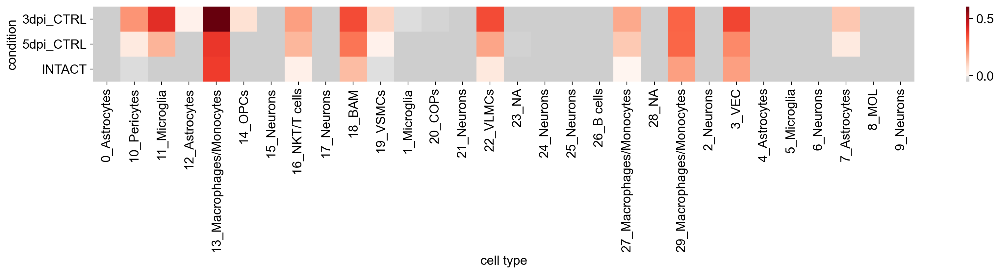

In [122]:
f, ax = plt.subplots(figsize=(20,1.5))
sb.heatmap(data_infmarkscore_ord_transposed, cmap=mymapred,annot=False, vmin=-0.05,linecolor='white')
plt.savefig('heatmap_immune_score2.pdf', dpi=300, bbox_inches = 'tight')

In [123]:
IRAS1=['Ccl2','Ccl20','Csf3','Cxcl1','Cxcl2','Cxcl3','Cxcl5','Fth1','Pdcd5','Pdlim4','Pitx3','Psme2','Serpine1','Sod2','Tnfaip6']
IRAS2=['B2m','Calr','Carhsp1','Ccl2','Cd47','Fth1','Icam1','Lap3','Nfkbia','Nnmt','Pdcd5','Pfn1','Pkm','Prelid1','Psme2','Sod2','Tmsb10','Vcam1'] #Leng et.al.2022

In [124]:
sc.tl.score_genes(adata_ctr_proc_2, IRAS1, score_name='IRAS1')

computing score 'IRAS1'
    finished: added
    'IRAS1', score of gene set (adata.obs).
    450 total control genes are used. (0:00:01)


In [125]:
sc.tl.score_genes(adata_ctr_proc_2, IRAS2, score_name='IRAS2')

computing score 'IRAS2'
    finished: added
    'IRAS2', score of gene set (adata.obs).
    350 total control genes are used. (0:00:01)


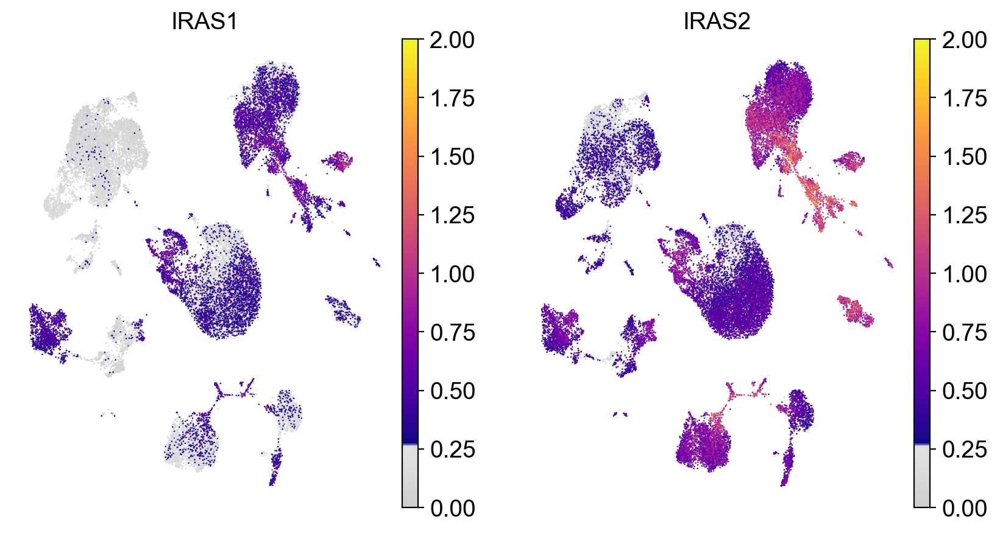

In [126]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['IRAS1', 'IRAS2'],legend_fontsize =float(12), cmap=mymap2, vmin=0, vmax=2, 
           legend_fontweight= 'normal', frameon= False , save='Lenget.al.2022.pdf' )

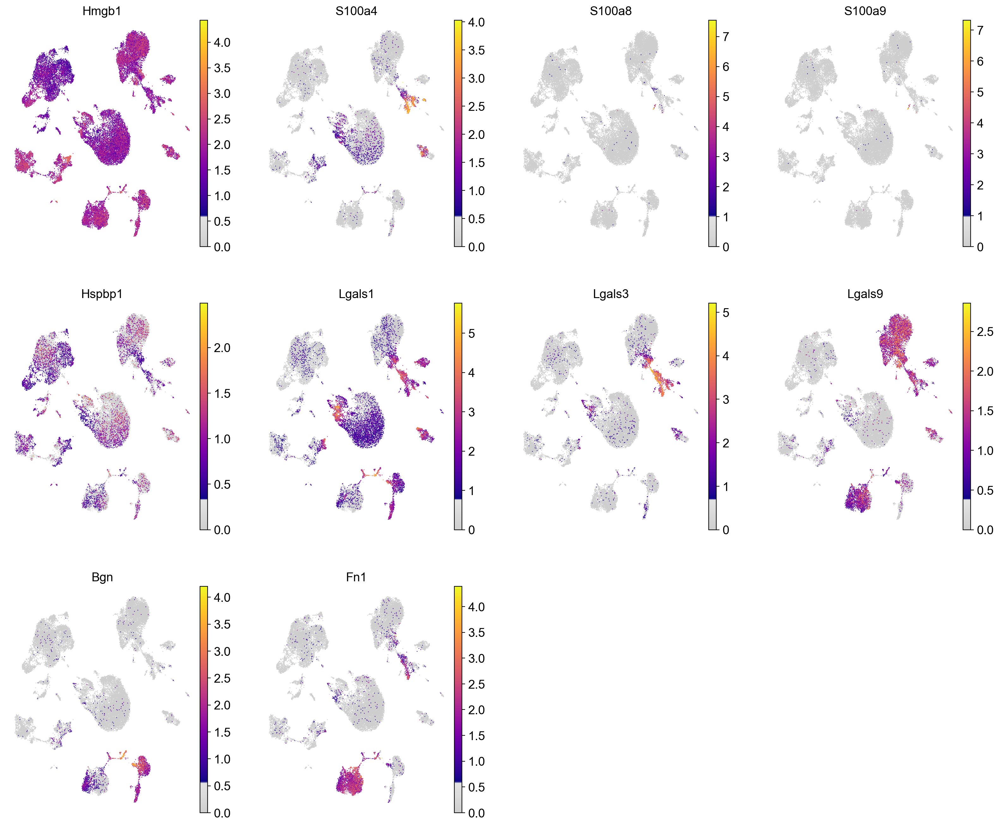

In [128]:
#Visualize the clustering and how this is reflected by different technical covariate
sc.pl.umap(adata_ctr_proc_2, color=['Hmgb1', 'S100a4', 'S100a8', 'S100a9', 'Hspbp1',
                                   'Lgals1', 'Lgals3', 'Lgals9', 'Bgn', 'Fn1'],legend_fontsize =float(12), cmap=mymap2,
           legend_fontweight= 'normal', frameon= False , save='DAMPs_Yamaguchi_2020.pdf' )

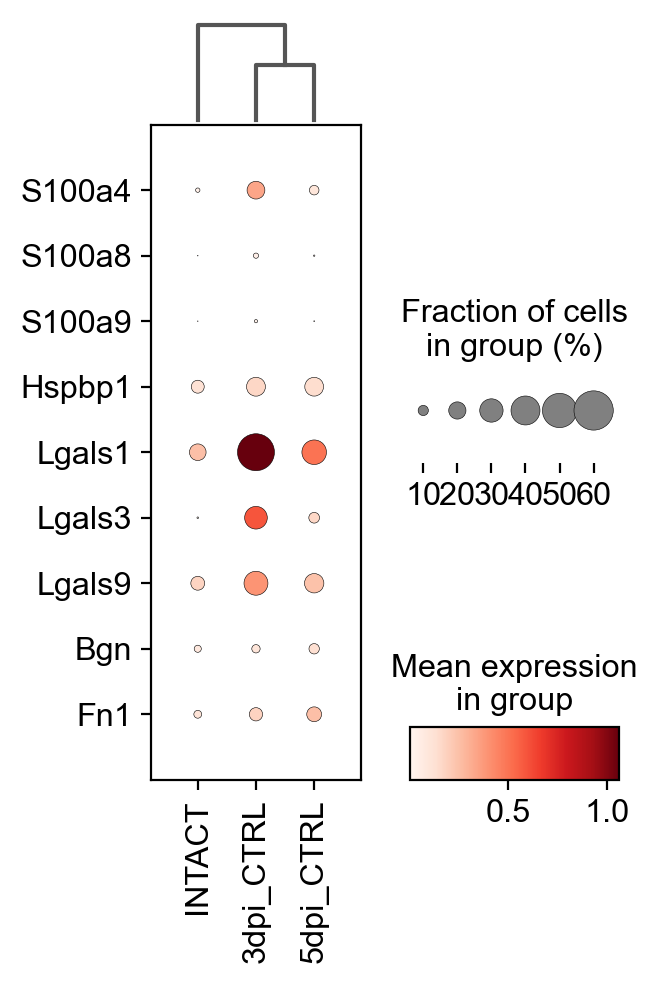

In [130]:
sc.pl.dotplot(adata_ctr_proc_2, var_names=['S100a4', 'S100a8', 'S100a9', 'Hspbp1',
                                   'Lgals1', 'Lgals3', 'Lgals9', 'Bgn', 'Fn1'], groupby='condition', swap_axes=True,
              dendrogram=True,figsize=(3,5),  save='DAMPs_Yamaguchi_2020_2.pdf')

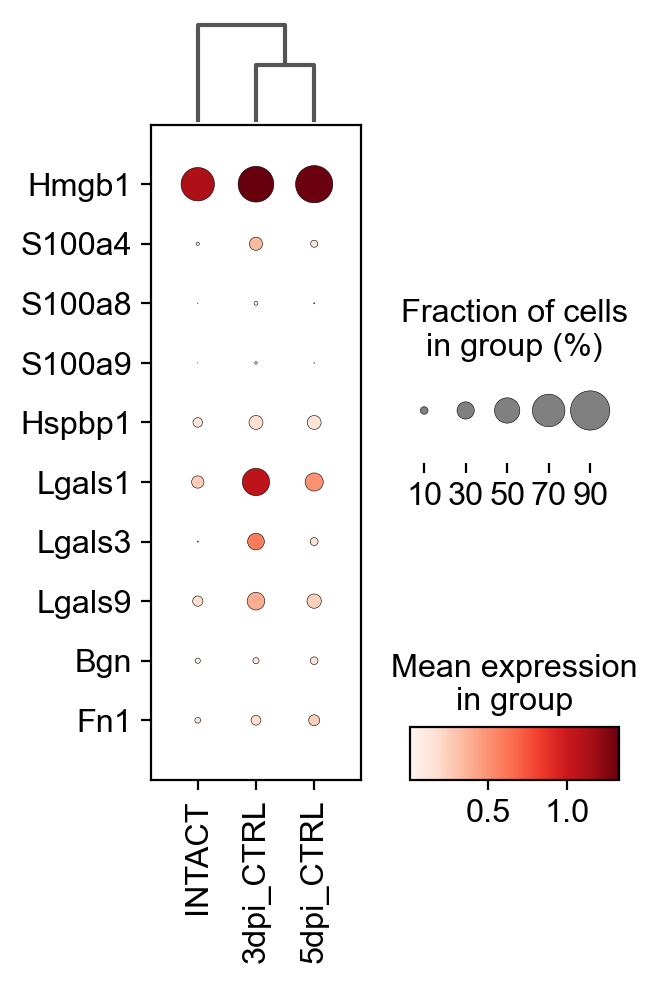

In [129]:
sc.pl.dotplot(adata_ctr_proc_2, var_names=['Hmgb1', 'S100a4', 'S100a8', 'S100a9', 'Hspbp1',
                                   'Lgals1', 'Lgals3', 'Lgals9', 'Bgn', 'Fn1'], groupby='condition', swap_axes=True,
              dendrogram=True,figsize=(3,5),  save='DAMPs_Yamaguchi_2020.pdf')

# Split cell populations

In [131]:
set(adata_ctr_proc_2.obs['annotated'])

{'0_Astrocytes',
 '10_Pericytes',
 '11_Microglia',
 '12_Astrocytes',
 '13_Macrophages/Monocytes',
 '14_OPCs',
 '15_Neurons',
 '16_NKT/T cells',
 '17_Neurons',
 '18_BAM',
 '19_VSMCs',
 '1_Microglia',
 '20_COPs',
 '21_Neurons',
 '22_VLMCs',
 '23_NA',
 '24_Neurons',
 '25_Neurons',
 '26_B cells',
 '27_Macrophages/Monocytes',
 '28_NA',
 '29_Macrophages/Monocytes',
 '2_Neurons',
 '3_VEC',
 '4_Astrocytes',
 '5_Microglia',
 '6_Neurons',
 '7_Astrocytes',
 '8_MOL',
 '9_Neurons'}

In [132]:
adata_ctr_proc_2

AnnData object with n_obs × n_vars = 35132 × 19290
    obs: 'sample_id', 'condition', 'batch', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'mt_frac', 'n_counts', 'n_genes', 'doublet_score', 'doublet', 'size_factors', 'leiden', '_scvi_batch', '_scvi_labels', 'leiden_scVI', 'leiden13', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'leiden_ctr', 'leiden_ctr07', 'leiden_ctr2', 'S_score', 'G2M_score', 'phase', 'Cycling cells', 'S phase', 'Cycling_cells', 'S_phase_cells', 'Microglia', 'DAM', 'Macrophages', 'BAM', 'Monocytes', 'DCs', 'NKT cells', 'T cells', 'B cells', 'Neutrophils', 'Neurons', 'OPCs', 'COPs', 'MOL', 'Astrocytes', 'Pericytes', 'VSMCs', 'VLMCs', 'VECV', 'annotated', 'annotatedgroup', 'common_innate_immunity_signature', 'IRAS1', 'IRAS2'

In [133]:
adata_all_astros_proc = adata_ctr_proc_2[np.in1d(adata_ctr_proc_2.obs['annotatedgroup'], 
                           ['Astrocytes'])].copy()

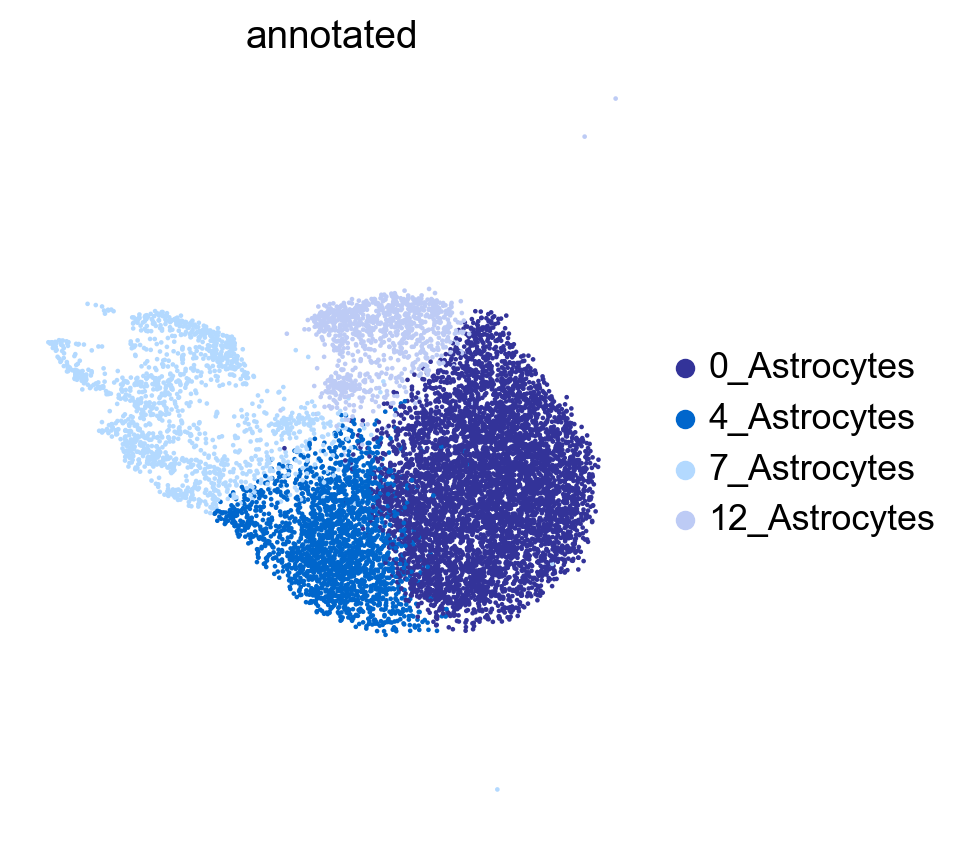

In [134]:
sc.pl.umap(adata_all_astros_proc,color='annotated', legend_fontweight= 'normal', frameon= False ,)

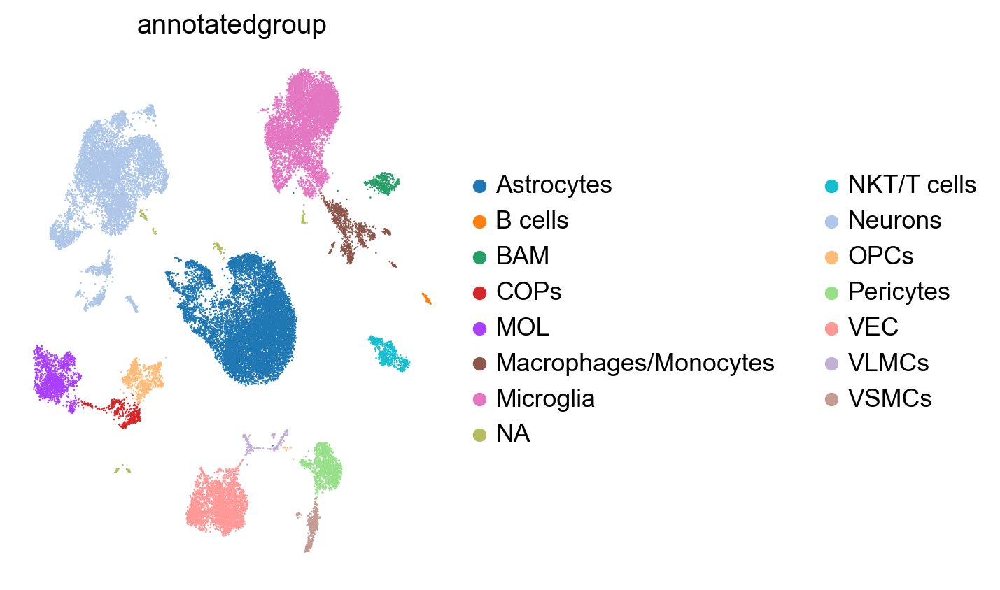

In [135]:
sc.pl.umap(adata_ctr_proc_2,color=['annotatedgroup'], legend_fontweight= 'normal', frameon= False , wspace=0.7)

In [136]:
adata_all_astros_proc.write(data_dir+today+'adata_ctr_astros_proc_scVI.h5ad')

In [137]:
today

'230721'

In [138]:
adata_all_oligos_proc = adata_ctr_proc_2[np.in1d(adata_ctr_proc_2.obs['annotatedgroup'], 
                           ['MOL', 'OPCs','COPs'])].copy()

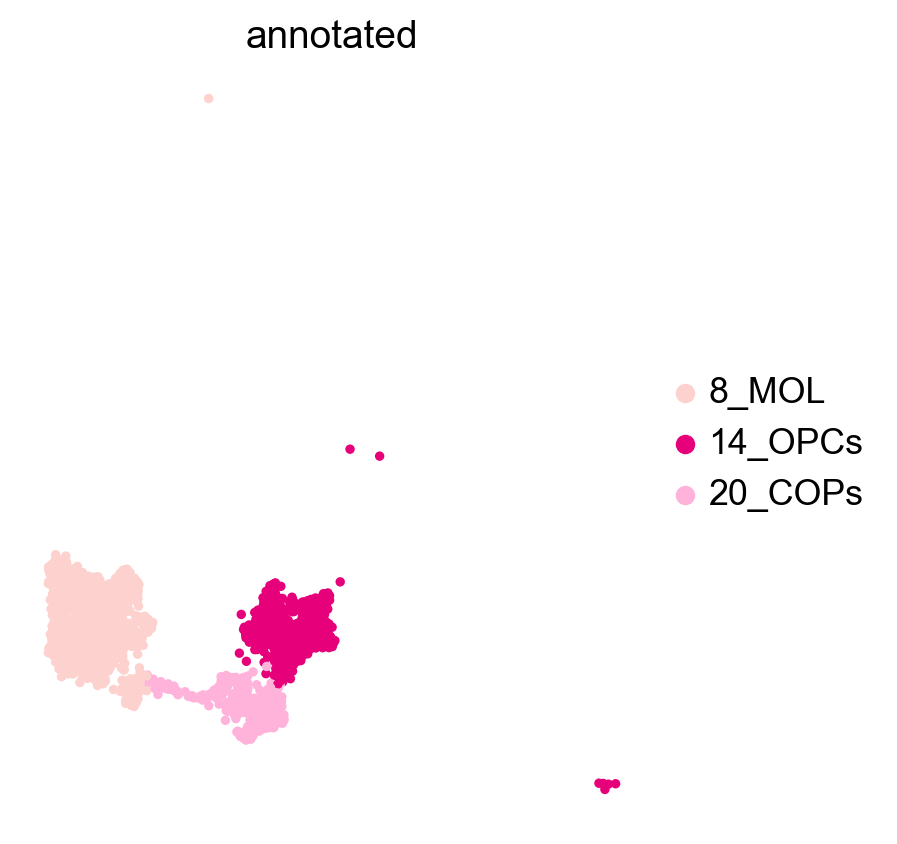

In [139]:
sc.pl.umap(adata_all_oligos_proc,color='annotated', legend_fontweight= 'normal', frameon= False ,)

In [140]:
adata_all_oligos_proc.write(data_dir+today+'adata_ctr_oligos_proc_scVI.h5ad')

In [141]:
adata_all_micro_proconly = adata_ctr_proc_2[np.in1d(adata_ctr_proc_2.obs['annotatedgroup'],['Microglia'])].copy()

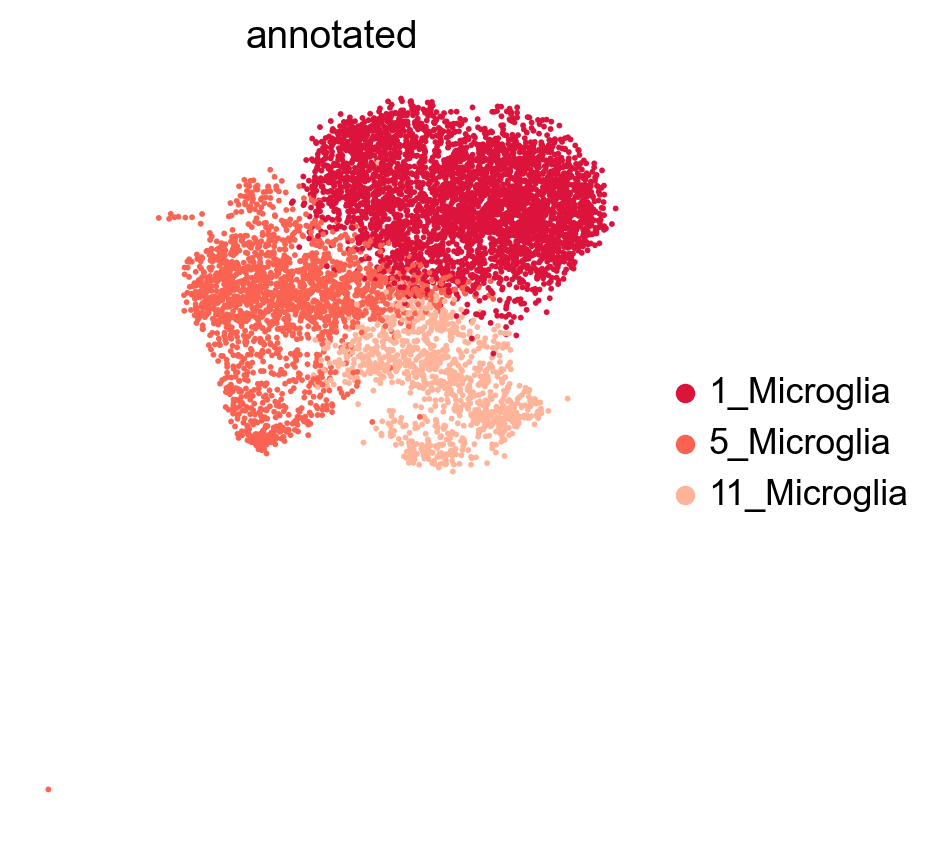

In [142]:
sc.pl.umap(adata_all_micro_proconly,color='annotated',legend_fontweight= 'normal', frameon= False ,)

In [143]:
adata_all_micro_proconly.write(data_dir+today+'adata_ctr_micro_only_proc_scVI.h5ad')